In [1]:
import torch
assert torch.cuda.is_available(), "Cuda isn't available"


In [2]:
import os
print(os.getcwd())

/home/labs/testing/class62/CT-Inpainting


In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
import torch
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
import time

from data_loader import CTDataset
from model_vqvae2 import VQVAE
from unet3d.models.pytorch.autoencoder.variational import ConvolutionalAutoEncoder

In [5]:
EASY_MODE = False

In [6]:
# model_path = r"./checkpoints/03-16-23-0052-epoch-300"
# model_path = r"./checkpoints/03-17-23-0125-epoch-300"
# model_path = r"./checkpoints/03-17-23-0145-epoch-300"
model_path = r"./checkpoints/03-17-23-0145-epoch-550"





In [7]:
device = torch.device('cuda')

model = ConvolutionalAutoEncoder(decoder_mirrors_encoder=True).to(device)
# optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)


checkpoint = torch.load(model_path)
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
epoch = checkpoint['epoch']
loss = checkpoint['loss']

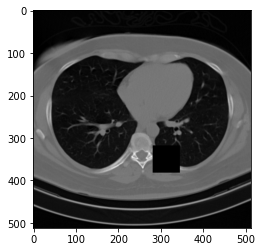

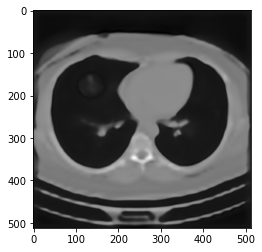

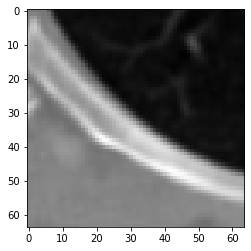

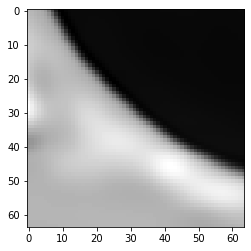

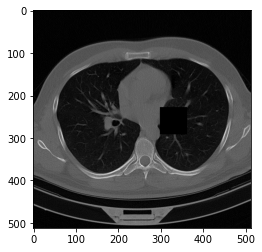

...

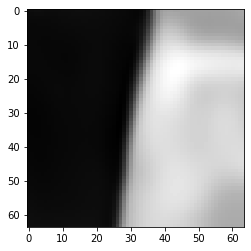

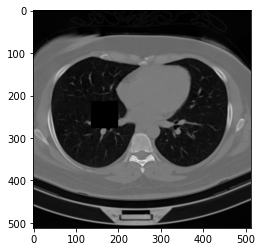

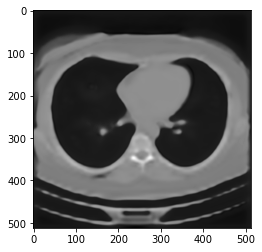

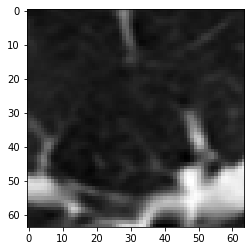

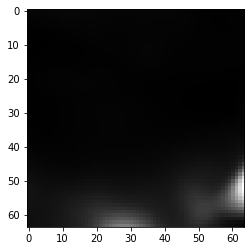

In [8]:
# model_path = r"./checkpoints/03-17-23-0145-epoch-550"

from ct_utils import ctshow

device = torch.device('cuda')
# Load data
DATASET_DIR = "COVID-CTset"
# train_set = CTDataset(DATASET_DIR, limit_dataset=1, num_masked_slices=2, padding_slices=3)
if EASY_MODE:
    mask_dims = (16, 16)
    inpaint_dims = (2, 16, 16)
else:
    mask_dims = (64, 64)
    inpaint_dims = (2, 64, 64)
    
train_set = CTDataset(DATASET_DIR, limit_dataset=5, num_masked_slices=2, padding_slices=3, mask_dims=mask_dims)

data_loader = torch.utils.data.DataLoader(train_set, batch_size=1, shuffle=True, num_workers=2)

# Initialize model
# model = VQVAE(in_channel=1).to(device)

with torch.no_grad():
    for i, (scan, mask, masked) in enumerate(data_loader):
        target = scan
        mask = mask.to(device)
        masked = masked.to(device)
        target = target.to(device)

        masked = masked[None, :]
        masked = masked.transpose(0, 1)
        output = model(masked)
        output = output.squeeze()

        predicted_mask = torch.masked_select(output, mask)
        target_mask = torch.masked_select(target, mask)
        predicted_mask = predicted_mask.to(torch.device('cpu')).reshape(*inpaint_dims)
        target_mask = target_mask.to(torch.device('cpu')).reshape(*inpaint_dims)

        masked = masked.squeeze().cpu()
        ctshow(masked[3])
        ctshow(output[3].cpu())
        ctshow(target_mask[0])
        ctshow(predicted_mask[0])

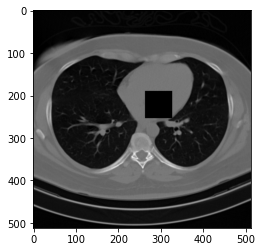

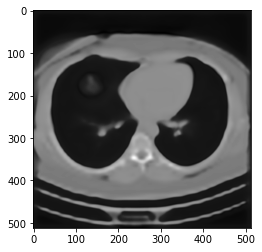

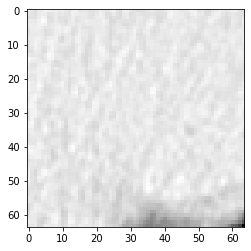

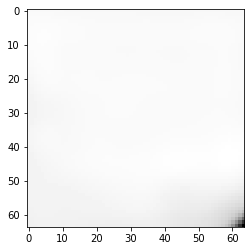

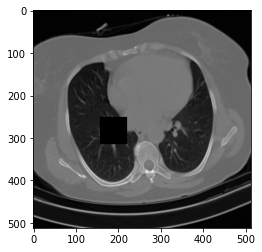

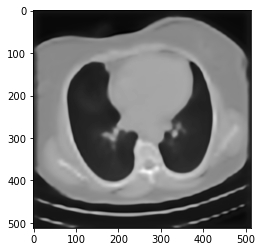

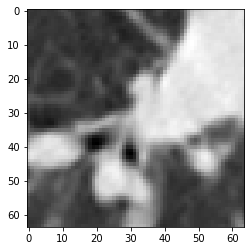

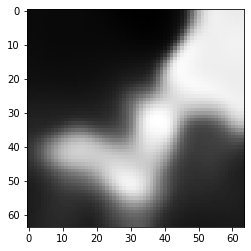

In [ ]:
# model_path = r"./checkpoints/03-17-23-0145-epoch-300"
from ct_utils import ctshow

device = torch.device('cuda')
# Load data
DATASET_DIR = "COVID-CTset"
# train_set = CTDataset(DATASET_DIR, limit_dataset=1, num_masked_slices=2, padding_slices=3)
if EASY_MODE:
    mask_dims = (16, 16)
    inpaint_dims = (2, 16, 16)
else:
    mask_dims = (64, 64)
    inpaint_dims = (2, 64, 64)
    
train_set = CTDataset(DATASET_DIR, limit_dataset=5, num_masked_slices=2, padding_slices=3, mask_dims=mask_dims)

data_loader = torch.utils.data.DataLoader(train_set, batch_size=1, shuffle=True, num_workers=2)

# Initialize model
# model = VQVAE(in_channel=1).to(device)

with torch.no_grad():
    for i, (scan, mask, masked) in enumerate(data_loader):
        target = scan
        mask = mask.to(device)
        masked = masked.to(device)
        target = target.to(device)

        masked = masked[None, :]
        masked = masked.transpose(0, 1)
        output = model(masked)
        output = output.squeeze()

        predicted_mask = torch.masked_select(output, mask)
        target_mask = torch.masked_select(target, mask)
        predicted_mask = predicted_mask.to(torch.device('cpu')).reshape(*inpaint_dims)
        target_mask = target_mask.to(torch.device('cpu')).reshape(*inpaint_dims)

        masked = masked.squeeze().cpu()
        ctshow(masked[3])
        ctshow(output[3].cpu())
        ctshow(target_mask[0])
        ctshow(predicted_mask[0])

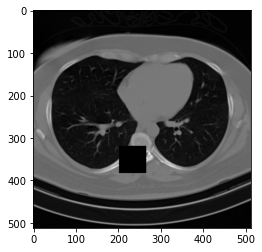

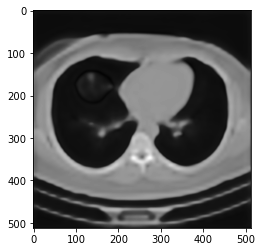

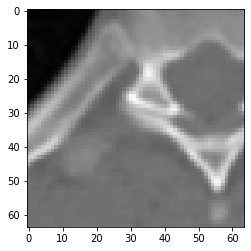

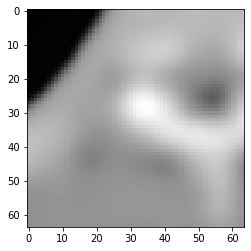

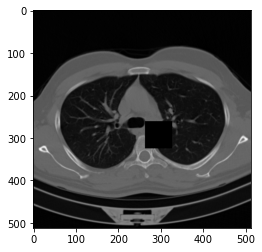

...

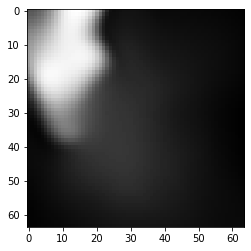

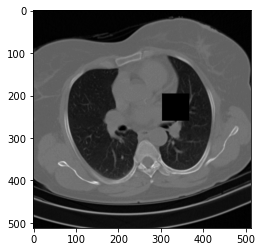

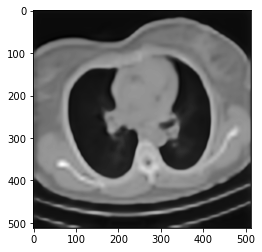

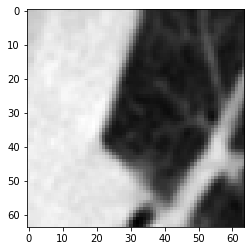

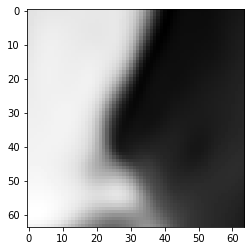

In [9]:
# model_path = r"./checkpoints/03-17-23-0125-epoch-300"
from ct_utils import ctshow

device = torch.device('cuda')
# Load data
DATASET_DIR = "COVID-CTset"
# train_set = CTDataset(DATASET_DIR, limit_dataset=1, num_masked_slices=2, padding_slices=3)
if EASY_MODE:
    mask_dims = (16, 16)
    inpaint_dims = (2, 16, 16)
else:
    mask_dims = (64, 64)
    inpaint_dims = (2, 64, 64)
    
train_set = CTDataset(DATASET_DIR, limit_dataset=5, num_masked_slices=2, padding_slices=3, mask_dims=mask_dims)

data_loader = torch.utils.data.DataLoader(train_set, batch_size=1, shuffle=True, num_workers=2)

# Initialize model
# model = VQVAE(in_channel=1).to(device)

with torch.no_grad():
    for i, (scan, mask, masked) in enumerate(data_loader):
        target = scan
        mask = mask.to(device)
        masked = masked.to(device)
        target = target.to(device)

        masked = masked[None, :]
        masked = masked.transpose(0, 1)
        output = model(masked)
        output = output.squeeze()

        predicted_mask = torch.masked_select(output, mask)
        target_mask = torch.masked_select(target, mask)
        predicted_mask = predicted_mask.to(torch.device('cpu')).reshape(*inpaint_dims)
        target_mask = target_mask.to(torch.device('cpu')).reshape(*inpaint_dims)

        masked = masked.squeeze().cpu()
        ctshow(masked[3])
        ctshow(output[3].cpu())
        ctshow(target_mask[0])
        ctshow(predicted_mask[0])

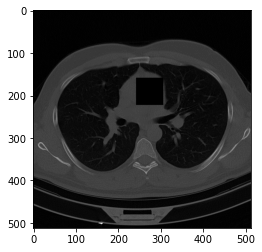

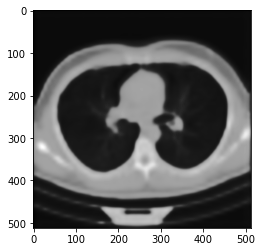

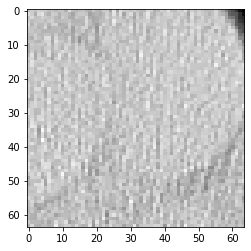

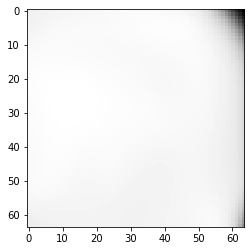

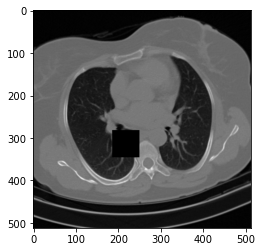

...

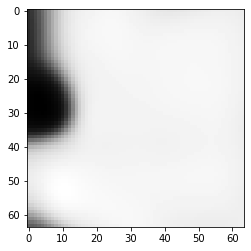

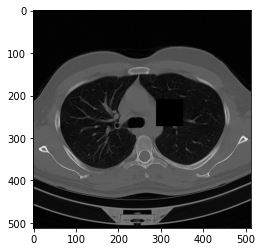

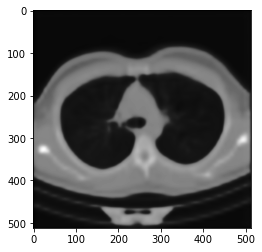

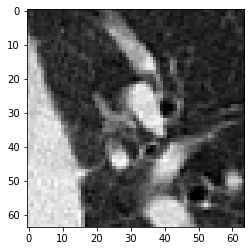

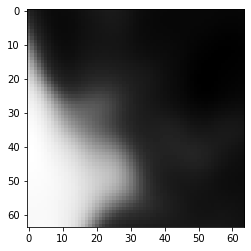

In [10]:
# model_path = r"./checkpoints/03-16-23-0052-epoch-300"
from ct_utils import ctshow

device = torch.device('cuda')
# Load data
DATASET_DIR = "COVID-CTset"
# train_set = CTDataset(DATASET_DIR, limit_dataset=1, num_masked_slices=2, padding_slices=3)
if EASY_MODE:
    mask_dims = (16, 16)
    inpaint_dims = (2, 16, 16)
else:
    mask_dims = (64, 64)
    inpaint_dims = (2, 64, 64)
    
train_set = CTDataset(DATASET_DIR, limit_dataset=5, num_masked_slices=2, padding_slices=3, mask_dims=mask_dims)

data_loader = torch.utils.data.DataLoader(train_set, batch_size=1, shuffle=True, num_workers=2)

# Initialize model
# model = VQVAE(in_channel=1).to(device)

with torch.no_grad():
    for i, (scan, mask, masked) in enumerate(data_loader):
        target = scan
        mask = mask.to(device)
        masked = masked.to(device)
        target = target.to(device)

        masked = masked[None, :]
        masked = masked.transpose(0, 1)
        output = model(masked)
        output = output.squeeze()

        predicted_mask = torch.masked_select(output, mask)
        target_mask = torch.masked_select(target, mask)
        predicted_mask = predicted_mask.to(torch.device('cpu')).reshape(*inpaint_dims)
        target_mask = target_mask.to(torch.device('cpu')).reshape(*inpaint_dims)

        masked = masked.squeeze().cpu()
        ctshow(masked[3])
        ctshow(output[3].cpu())
        ctshow(target_mask[0])
        ctshow(predicted_mask[0])